In [1]:
# Install Roboflow and download the dataset with proper annotations
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="nlEcpoTCd1Qm2dDdWqux")
project = rf.workspace("university-of-tokyo-eqewd").project("rugby-model")
version = project.version(3)
dataset = version.download("yolov5")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 44.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Rugby-model-3 in yolov5pytorch:: 100%|██████████| 4244/4244 [00:01<00:00, 3706.09it/s]


In [2]:
# Set up YOLOv5 environment
# This installs YOLOv5 and its dependencies

# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5

# Change directory to YOLOv5
%cd yolov5

# Install dependencies
!pip install -r requirements.txt

# Return to the root directory
%cd ..

# Create a symbolic link to the dataset for easier access from YOLOv5
import os
from pathlib import Path

# Path to the dataset
dataset_path = Path('./Rugby-Model-3')

# Make sure YOLOv5 can access the dataset
if not os.path.exists('./yolov5/Rugby-Model-3'):
    os.symlink(os.path.abspath('./Rugby-Model-3'), './yolov5/Rugby-Model-3')
    print("Created symbolic link to dataset in YOLOv5 directory")
else:
    print("Symbolic link already exists")

print("YOLOv5 environment setup complete!")

Cloning into 'yolov5'...
remote: Enumerating objects: 17483, done.
remote: Counting objects: 100% (106/106), done.
remote: Compressing objects: 100% (77/77), done.
remote: Total 17483 (delta 77), reused 29 (delta 29), pack-reused 17377 (from 3)
Receiving objects: 100% (17483/17483), 16.35 MiB | 13.46 MiB/s, done.
Resolving deltas: 100% (11988/11988), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s

In [3]:
# Correct Dataset Path for YOLOv5 Training
# This script identifies the correct dataset location and creates a proper data.yaml file

import yaml
import os
from pathlib import Path
import glob

dataset_path = Path('/content/Rugby-model-3')

if not dataset_path.exists():
    print(f"ERROR: Dataset not found at {dataset_path}")
    exit()

print(f"Found dataset at: {dataset_path}")

# List the contents of the dataset directory
print("\nContents of dataset directory:")
for item in os.listdir(dataset_path):
    item_path = dataset_path / item
    if item_path.is_dir():
        print(f"  {item}/ (directory)")
        # List first few items in the subdirectory
        subdir_items = list(item_path.glob('*'))[:5]
        for subitem in subdir_items:
            print(f"    {subitem.name}")
        if len(list(item_path.glob('*'))) > 5:
            print(f"    ... and more items")
    else:
        print(f"  {item} (file)")

# Define paths to train, validation, and test directories
# We need to find these within the dataset directory
train_dir = None
valid_dir = None
test_dir = None

# Look for the train directory
possible_train_dirs = [
    dataset_path / 'train',
    dataset_path / 'training',
    dataset_path / 'train' / 'images',
    dataset_path
]

for dir_path in possible_train_dirs:
    if dir_path.exists() and dir_path.is_dir():
        # Check if it contains images
        if list(dir_path.glob('*.jpg')) or list(dir_path.glob('*.png')):
            train_dir = dir_path
            print(f"Found train directory: {train_dir}")
            break

# Look for the validation directory
possible_valid_dirs = [
    dataset_path / 'valid',
    dataset_path / 'validation',
    dataset_path / 'val',
    dataset_path / 'valid' / 'images',
    dataset_path
]

for dir_path in possible_valid_dirs:
    if dir_path.exists() and dir_path.is_dir():
        # Check if it contains images
        if list(dir_path.glob('*.jpg')) or list(dir_path.glob('*.png')):
            valid_dir = dir_path
            print(f"Found validation directory: {valid_dir}")
            break

# Look for the test directory
possible_test_dirs = [
    dataset_path / 'test',
    dataset_path / 'testing',
    dataset_path / 'test' / 'images',
    dataset_path
]

for dir_path in possible_test_dirs:
    if dir_path.exists() and dir_path.is_dir():
        # Check if it contains images
        if list(dir_path.glob('*.jpg')) or list(dir_path.glob('*.png')):
            test_dir = dir_path
            print(f"Found test directory: {test_dir}")
            break

# If train_dir is still None, check if the dataset is flat (all images in one directory)
if train_dir is None:
    if list(dataset_path.glob('*.jpg')) or list(dataset_path.glob('*.png')):
        print("Dataset appears to be flat (all images in one directory)")
        # In this case, we'll use the same directory for train, val, and test
        train_dir = valid_dir = test_dir = dataset_path

# Define the class names
class_names = ['ball', 'line out', 'maul', 'player', 'referee', 'ruck', 'scrum']

# Create the data.yaml configuration
data_config = {
    'nc': len(class_names),
    'names': class_names
}

if train_dir:
    data_config['train'] = str(train_dir)
if valid_dir:
    data_config['val'] = str(valid_dir)
if test_dir:
    data_config['test'] = str(test_dir)

# Path to save the data.yaml file
yolo_data_path = '/content/yolov5/data_rugby.yaml'

# Save the configuration to a YAML file
with open(yolo_data_path, 'w') as f:
    yaml.dump(data_config, f, default_flow_style=False)

print(f"\nCreated data_rugby.yaml in YOLOv5 directory:")
print("-" * 50)
with open(yolo_data_path, 'r') as f:
    print(f.read())
print("-" * 50)

# Find the label directories
train_labels_dir = None
valid_labels_dir = None
test_labels_dir = None

# Look for train labels
if train_dir:
    possible_train_label_dirs = [
        train_dir.parent / 'labels',
        train_dir / 'labels',
        train_dir.parent.parent / 'train' / 'labels',
        Path(str(train_dir).replace('images', 'labels'))
    ]

    for dir_path in possible_train_label_dirs:
        if dir_path.exists() and dir_path.is_dir():
            if list(dir_path.glob('*.txt')):
                train_labels_dir = dir_path
                print(f"Found train labels directory: {train_labels_dir}")
                break

# Look for validation labels
if valid_dir:
    possible_valid_label_dirs = [
        valid_dir.parent / 'labels',
        valid_dir / 'labels',
        valid_dir.parent.parent / 'valid' / 'labels',
        Path(str(valid_dir).replace('images', 'labels'))
    ]

    for dir_path in possible_valid_label_dirs:
        if dir_path.exists() and dir_path.is_dir():
            if list(dir_path.glob('*.txt')):
                valid_labels_dir = dir_path
                print(f"Found validation labels directory: {valid_labels_dir}")
                break

# Look for test labels
if test_dir:
    possible_test_label_dirs = [
        test_dir.parent / 'labels',
        test_dir / 'labels',
        test_dir.parent.parent / 'test' / 'labels',
        Path(str(test_dir).replace('images', 'labels'))
    ]

    for dir_path in possible_test_label_dirs:
        if dir_path.exists() and dir_path.is_dir():
            if list(dir_path.glob('*.txt')):
                test_labels_dir = dir_path
                print(f"Found test labels directory: {test_labels_dir}")
                break

print("\nSetup complete. Ready to train the model.")

Found dataset at: /content/Rugby-model-3

Contents of dataset directory:
  data.yaml (file)
  test/ (directory)
    labels
    images
  train/ (directory)
    labels
    images
  valid/ (directory)
    labels
    images
  README.roboflow.txt (file)
  README.dataset.txt (file)
Found train directory: /content/Rugby-model-3/train/images
Found validation directory: /content/Rugby-model-3/valid/images
Found test directory: /content/Rugby-model-3/test/images

Created data_rugby.yaml in YOLOv5 directory:
--------------------------------------------------
names:
- ball
- line out
- maul
- player
- referee
- ruck
- scrum
nc: 7
test: /content/Rugby-model-3/test/images
train: /content/Rugby-model-3/train/images
val: /content/Rugby-model-3/valid/images

--------------------------------------------------
Found train labels directory: /content/Rugby-model-3/train/labels
Found validation labels directory: /content/Rugby-model-3/valid/labels
Found test labels directory: /content/Rugby-model-3/test/lab

In [4]:
# Train Rugby Detection Model
# This script trains YOLOv5 on the rugby dataset

# Change directory to YOLOv5
%cd /content/yolov5

# Define training parameters
IMG_SIZE = 640        # Image size (pixels)
BATCH_SIZE = 16       # Batch size (reduce if you get CUDA out of memory)
EPOCHS = 100          # Number of training epochs
MODEL_SIZE = 's'      # Model size: 's', 'm', 'l', or 'x'
DATA_CONFIG = '/content/yolov5/data_rugby.yaml'  # Path to our data configuration file

# Disable wandb to avoid login prompts
import os
os.environ['WANDB_MODE'] = 'disabled'

# Check for GPU availability
import torch
if torch.cuda.is_available():
    DEVICE = 0  # Use GPU
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    DEVICE = 'cpu'  # Use CPU
    print("No GPU available, using CPU (training will be slow)")

# Print training configuration
print("\nStarting YOLOv5 training...")
print(f"Model: YOLOv5{MODEL_SIZE}")
print(f"Image size: {IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Epochs: {EPOCHS}")
print(f"Device: {'GPU' if DEVICE == 0 else 'CPU'}")
print(f"Data config: {DATA_CONFIG}")

# Execute the training command
# Adding --cache for faster loading and --save-period to save checkpoints
!python train.py --img {IMG_SIZE} --batch {BATCH_SIZE} --epochs {EPOCHS} --data {DATA_CONFIG} --weights yolov5{MODEL_SIZE}.pt --device {DEVICE} --name rugby_model --exist-ok --cache --save-period 10

# Return to original directory
%cd /content

print("\nTraining complete!")
print("The trained model weights are saved in:")
print("  /content/yolov5/runs/train/rugby_model/weights/best.pt (best model)")
print("  /content/yolov5/runs/train/rugby_model/weights/last.pt (last model)")
print("\nYou can use these weights for inference on new images.")

Streaming output truncated to the last 5000 lines.
      79/99      4.67G    0.03771    0.04478   0.003105        603        640:   2% 2/116 [00:00<00:29,  3.89it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      79/99      4.67G    0.03852    0.05857   0.003128        911        640:   3% 3/116 [00:00<00:28,  3.95it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      79/99      4.67G    0.03744    0.06129   0.003069        715        640:   3% 4/116 [00:01<00:30,  3.73it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      79/99      4.67G    0.03813    

In [5]:
# Evaluate Rugby Detection Model
# This script evaluates the trained model on the test dataset

# Change directory to YOLOv5
%cd /content/yolov5

# Define evaluation parameters
IMG_SIZE = 640        # Image size (pixels)
BATCH_SIZE = 16       # Batch size
CONF_THRESH = 0.25    # Confidence threshold
IOU_THRESH = 0.45     # IoU threshold for NMS
DATA_CONFIG = '/content/yolov5/data_rugby.yaml'  # Path to our data configuration file

# Path to the trained model weights
MODEL_WEIGHTS = '/content/yolov5/runs/train/rugby_model/weights/best.pt'

# Check if the model file exists
import os
if not os.path.exists(MODEL_WEIGHTS):
    print(f"WARNING: Model weights not found at {MODEL_WEIGHTS}")
    print("Using the last weights instead...")
    MODEL_WEIGHTS = '/content/yolov5/runs/train/rugby_model/weights/last.pt'

    # If that doesn't exist either, we have a problem
    if not os.path.exists(MODEL_WEIGHTS):
        print(f"ERROR: No model weights found. Please train the model first.")
        exit()

# Check for GPU availability
import torch
if torch.cuda.is_available():
    DEVICE = 0  # Use GPU
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    DEVICE = 'cpu'  # Use CPU
    print("No GPU available, using CPU (evaluation will be slow)")

# Print evaluation configuration
print("\nEvaluating YOLOv5 model...")
print(f"Model weights: {MODEL_WEIGHTS}")
print(f"Image size: {IMG_SIZE}")
print(f"Confidence threshold: {CONF_THRESH}")
print(f"IoU threshold: {IOU_THRESH}")
print(f"Device: {'GPU' if DEVICE == 0 else 'CPU'}")

# Execute the validation command
# We'll save detection results and generate confusion matrix
!python val.py --weights {MODEL_WEIGHTS} --data {DATA_CONFIG} --img {IMG_SIZE} --batch {BATCH_SIZE} --conf-thres {CONF_THRESH} --iou-thres {IOU_THRESH} --task test --device {DEVICE} --save-txt --save-conf --name rugby_eval

# Return to original directory
%cd /content

print("\nEvaluation complete!")
print("The evaluation results are saved in /content/yolov5/runs/val/rugby_eval/")
print("\nKey metrics explanation:")
print("- Precision (P): Accuracy of positive predictions. Higher is better.")
print("- Recall (R): Fraction of positives correctly identified. Higher is better.")
print("- mAP@0.5: Mean Average Precision at IoU=0.5. Higher is better.")
print("- mAP@0.5:0.95: Mean Average Precision averaged over IoU thresholds. Higher is better.")

/content/yolov5
Using GPU: Tesla T4

Evaluating YOLOv5 model...
Model weights: /content/yolov5/runs/train/rugby_model/weights/best.pt
Image size: 640
Confidence threshold: 0.25
IoU threshold: 0.45
Device: GPU
val: data=/content/yolov5/data_rugby.yaml, weights=['/content/yolov5/runs/train/rugby_model/weights/best.pt'], batch_size=16, imgsz=640, conf_thres=0.25, iou_thres=0.45, max_det=300, task=test, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=True, save_json=False, project=runs/val, name=rugby_eval, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.25 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/Rugby-model-3/test/labels... 91 images, 0 backgrounds, 0 corrupt: 100% 91/91 [00:00<00:00, 351.32it/s]
test: New c

/content/yolov5
Using GPU: Tesla T4
Rugby Object Detection - Test Model
1. Upload new images for detection
2. Run detection on test set images
3. Exit

Selected option 2

Running detection on the test set...
detect: weights=['/content/yolov5/runs/train/rugby_model/weights/best.pt'], source=/content/Rugby-model-3/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=rugby_test_detection, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
image 1/91 /content/Rugby-model-3/test/images/IMG_1

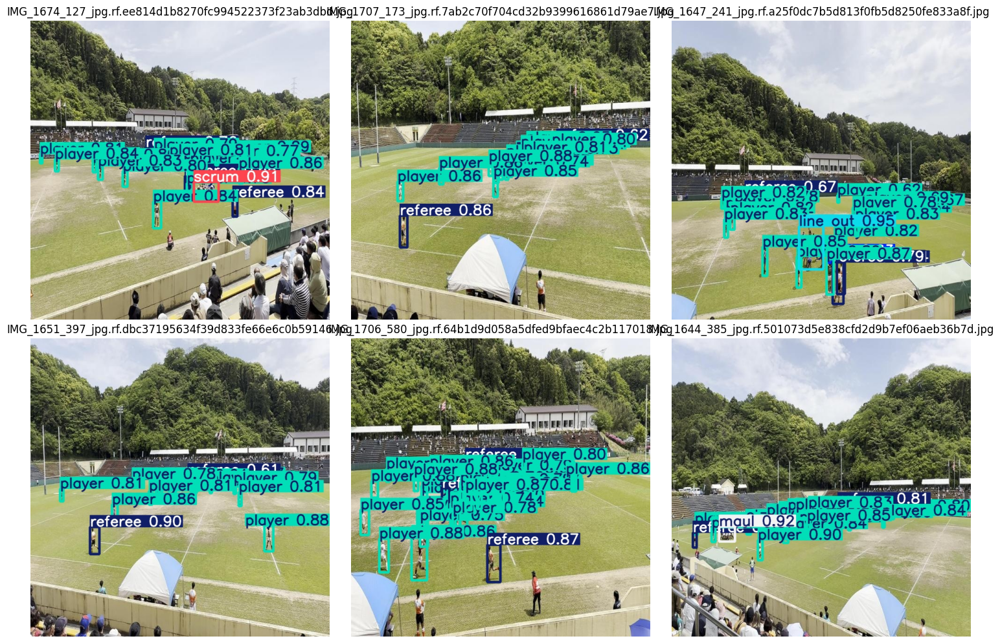

/content


In [6]:
# Test Rugby Detection Model on New Images
# This script performs inference on new rugby images

# Change directory to YOLOv5
%cd /content/yolov5

# Import necessary libraries
import os
import shutil
from pathlib import Path
from google.colab import files

# Create a directory for test images
test_dir = Path('/content/test_images')
os.makedirs(test_dir, exist_ok=True)

# Path to the trained model weights
MODEL_WEIGHTS = '/content/yolov5/runs/train/rugby_model/weights/best.pt'

# Check if the model file exists
if not os.path.exists(MODEL_WEIGHTS):
    print(f"WARNING: Best model weights not found at {MODEL_WEIGHTS}")
    print("Using the last weights instead...")
    MODEL_WEIGHTS = '/content/yolov5/runs/train/rugby_model/weights/last.pt'

    # If that doesn't exist either, we have a problem
    if not os.path.exists(MODEL_WEIGHTS):
        print(f"ERROR: No model weights found. Please train the model first.")
        exit()

# Define inference parameters
IMG_SIZE = 640        # Image size (pixels)
CONF_THRESH = 0.25    # Confidence threshold
IOU_THRESH = 0.45     # IoU threshold for NMS

# Check for GPU availability
import torch
if torch.cuda.is_available():
    DEVICE = 0  # Use GPU
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    DEVICE = 'cpu'  # Use CPU
    print("No GPU available, using CPU (inference will be slower)")

# Function to run inference on uploaded images
def run_inference_on_uploads():
    print("\nPlease upload rugby images for detection...")
    uploaded = files.upload()

    # Copy uploaded files to test_dir
    for filename in uploaded.keys():
        shutil.copy(filename, test_dir / filename)
        print(f"Copied {filename} to {test_dir}")

    if not uploaded:
        print("No files were uploaded. Exiting...")
        return

    # Run detection on the uploaded images
    print("\nRunning detection on uploaded images...")
    !python detect.py --weights {MODEL_WEIGHTS} --source {test_dir} --img {IMG_SIZE} --conf {CONF_THRESH} --iou {IOU_THRESH} --device {DEVICE} --save-txt --save-conf --name rugby_detection

    print("\nDetection complete!")
    print("Results saved to: /content/yolov5/runs/detect/rugby_detection/")

    # Display the results
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    from PIL import Image

    result_dir = Path('/content/yolov5/runs/detect/rugby_detection')
    result_images = list(result_dir.glob('*.jpg')) + list(result_dir.glob('*.png'))

    if not result_images:
        print("No result images found.")
        return

    print("\nDisplaying detection results:")
    num_images = len(result_images)
    cols = min(3, num_images)
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    if rows == 1 and cols == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    for i, img_path in enumerate(result_images):
        if i < len(axes):
            img = mpimg.imread(img_path)
            axes[i].imshow(img)
            axes[i].set_title(img_path.name)
            axes[i].axis('off')

    # Hide unused axes
    for i in range(num_images, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Function to run inference on test set images
def run_inference_on_test_set():
    print("\nRunning detection on the test set...")

    # Get path to test images from data.yaml
    import yaml
    with open('/content/yolov5/data_rugby.yaml', 'r') as f:
        data_config = yaml.safe_load(f)

    test_path = data_config.get('test', None)
    if not test_path or not os.path.exists(test_path):
        print(f"Test set path not found at {test_path}")
        return

    # Run detection on test set
    !python detect.py --weights {MODEL_WEIGHTS} --source {test_path} --img {IMG_SIZE} --conf {CONF_THRESH} --iou {IOU_THRESH} --device {DEVICE} --save-txt --save-conf --name rugby_test_detection

    print("\nDetection complete!")
    print("Results saved to: /content/yolov5/runs/detect/rugby_test_detection/")

    # Display some random results (up to 6 images)
    import random
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    import numpy as np

    result_dir = Path('/content/yolov5/runs/detect/rugby_test_detection')
    result_images = list(result_dir.glob('*.jpg')) + list(result_dir.glob('*.png'))

    if not result_images:
        print("No result images found.")
        return

    # Select random images (up to 6)
    num_display = min(6, len(result_images))
    random_images = random.sample(result_images, num_display)

    print(f"\nDisplaying {num_display} random detection results:")
    cols = min(3, num_display)
    rows = (num_display + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    if rows == 1 and cols == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    for i, img_path in enumerate(random_images):
        if i < len(axes):
            img = mpimg.imread(img_path)
            axes[i].imshow(img)
            axes[i].set_title(img_path.name)
            axes[i].axis('off')

    # Hide unused axes
    for i in range(num_display, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Main menu
print("Rugby Object Detection - Test Model")
print("==================================")
print("1. Upload new images for detection")
print("2. Run detection on test set images")
print("3. Exit")

# For automatic execution, let's choose option 2
choice = 2
print(f"\nSelected option {choice}")

if choice == 1:
    run_inference_on_uploads()
elif choice == 2:
    run_inference_on_test_set()
else:
    print("Exiting...")

# Return to original directory
%cd /content

RUGBY DETECTION MODEL EVALUATION


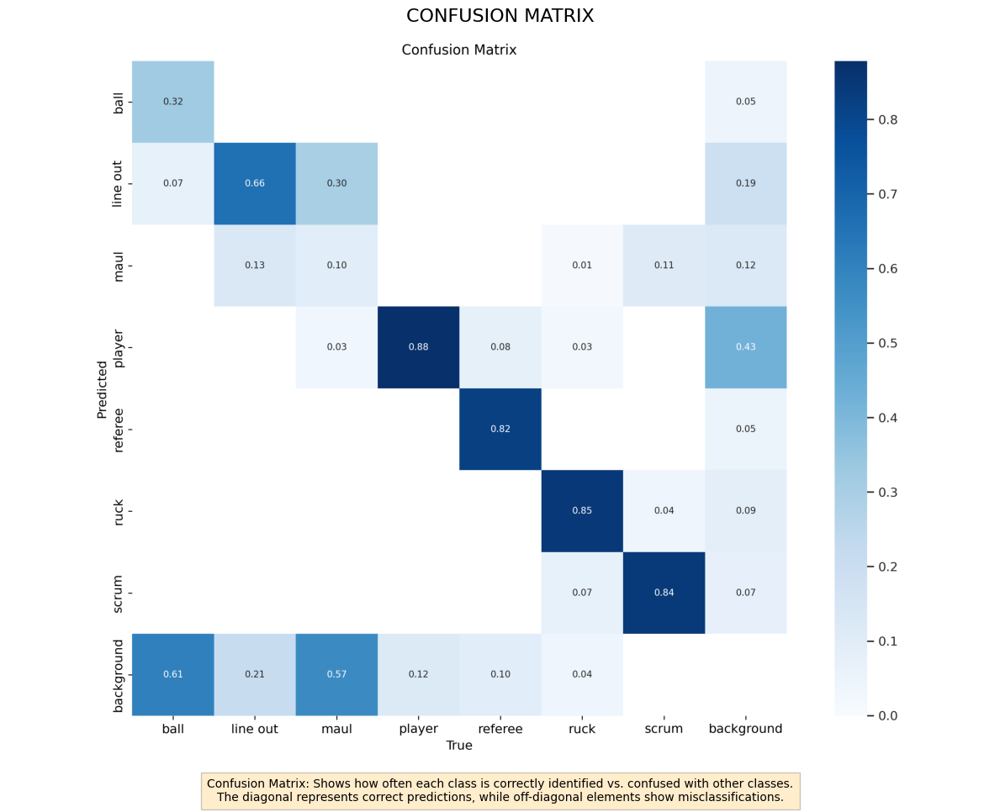

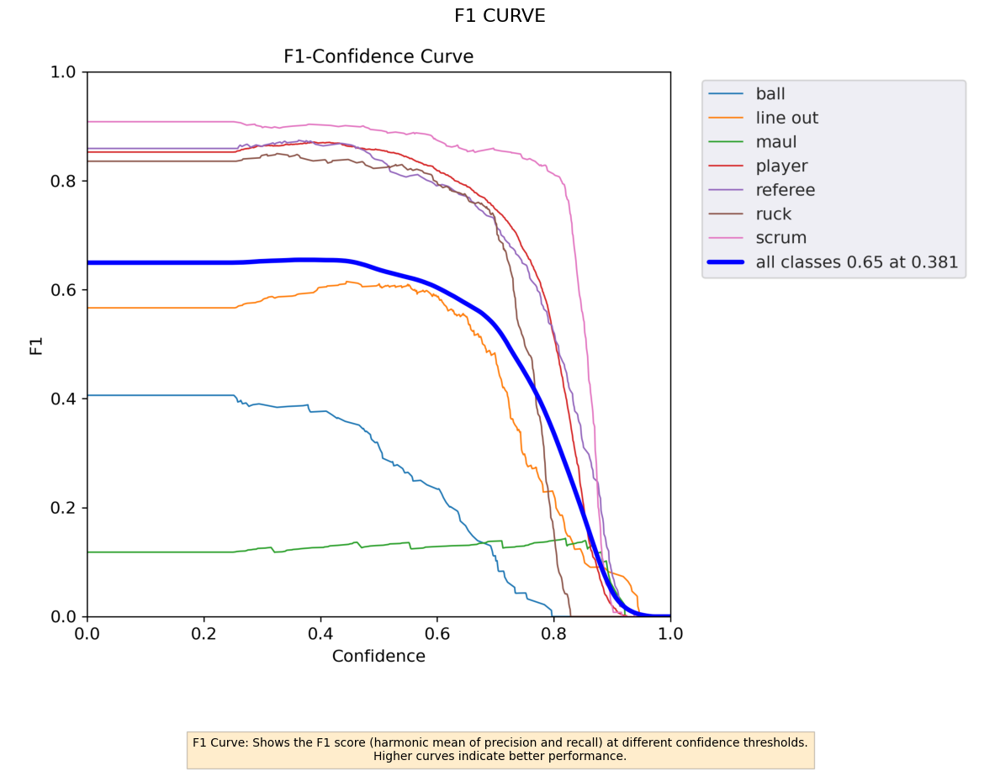

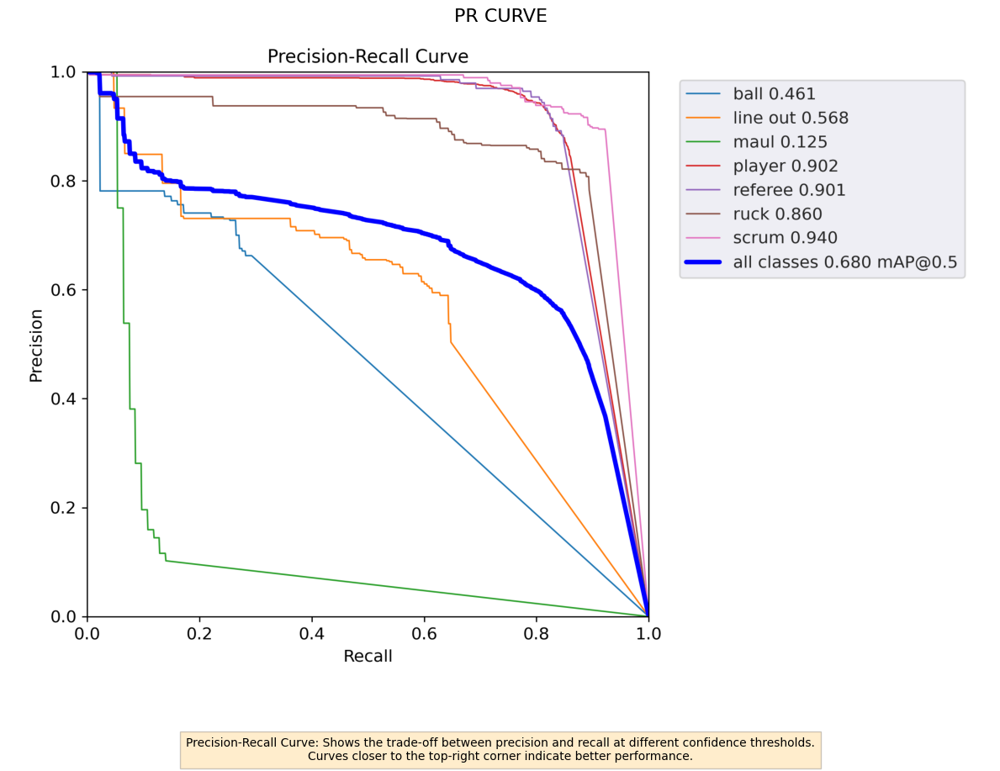

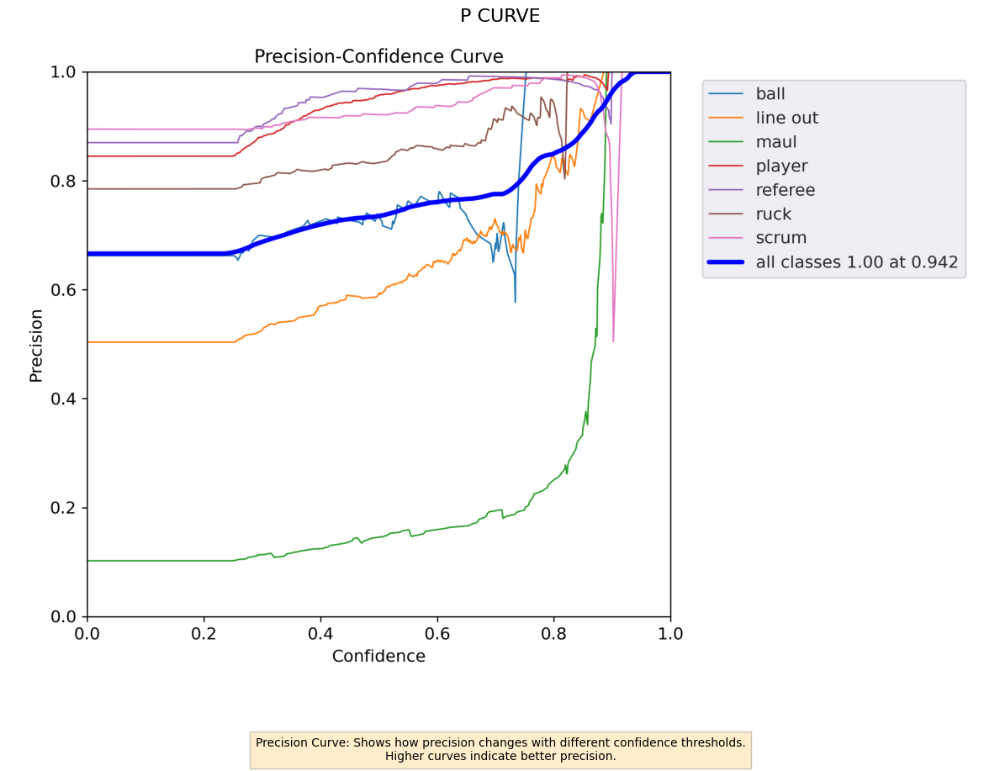

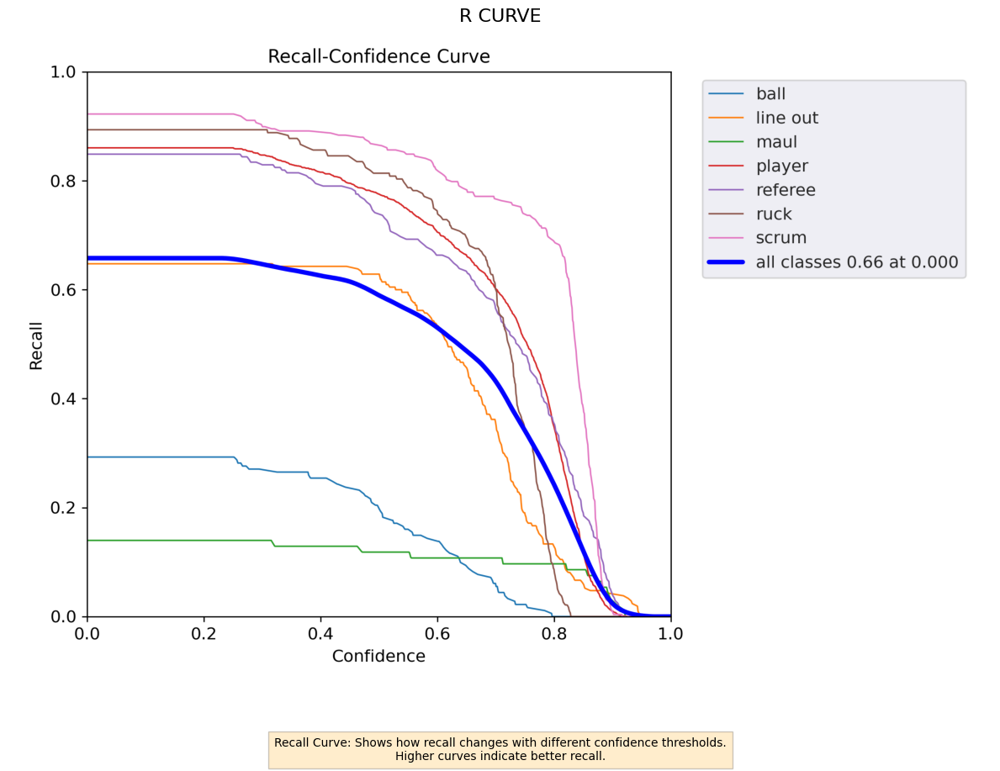

Results.txt not found
RUGBY DETECTION MODEL EVALUATION


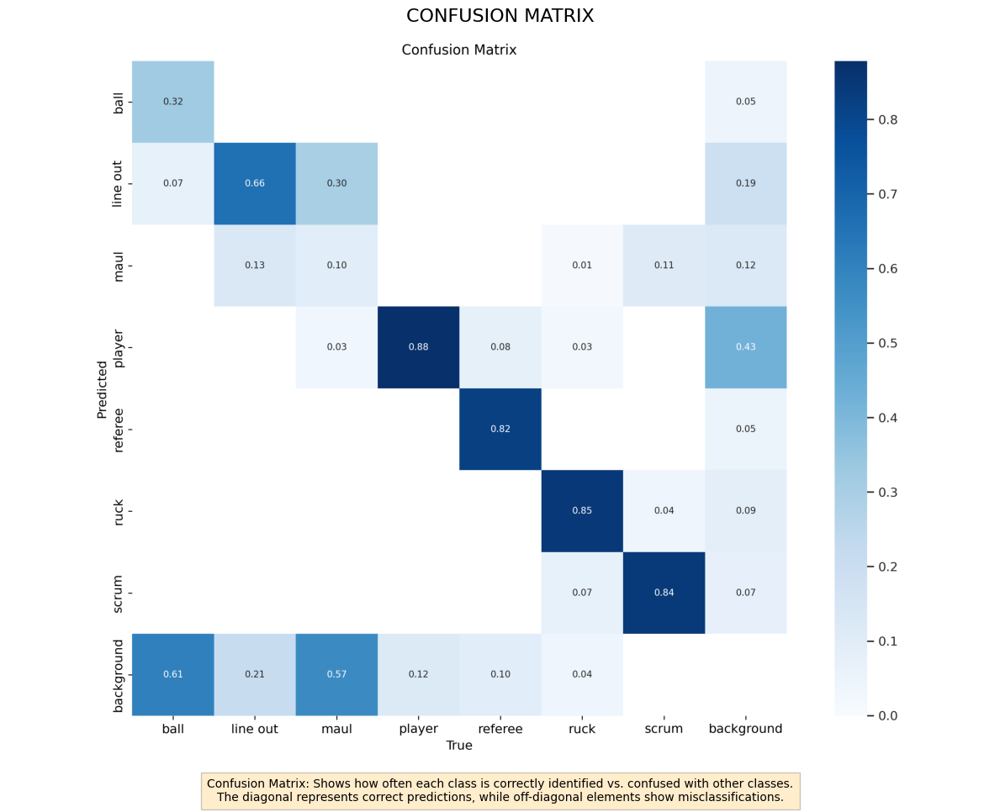

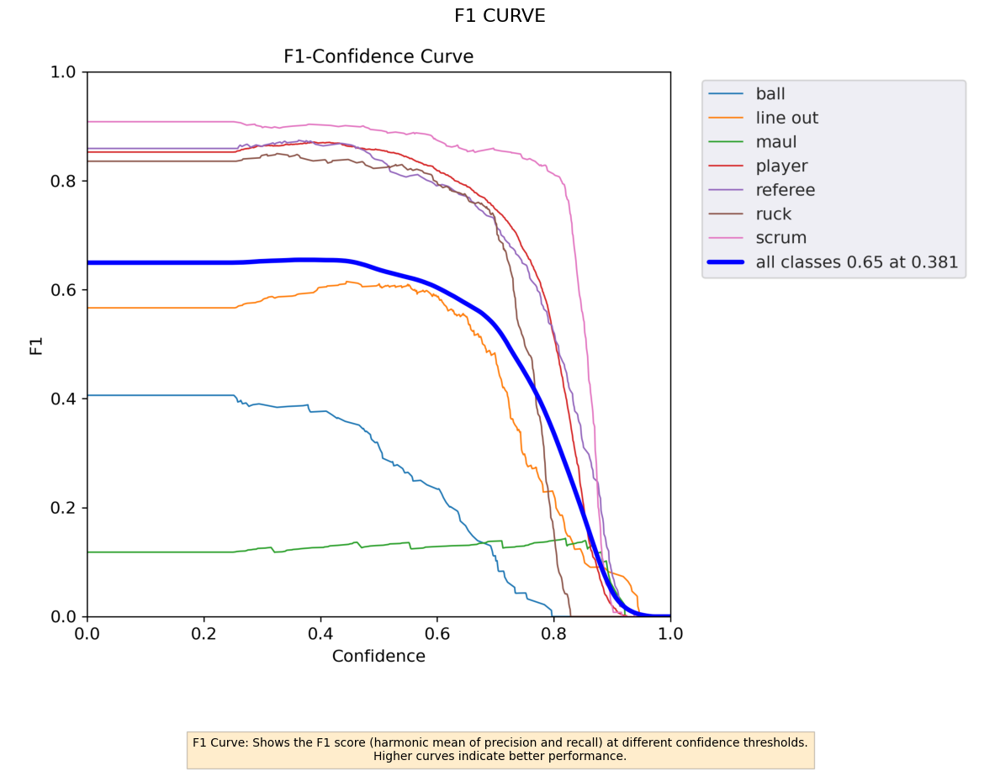

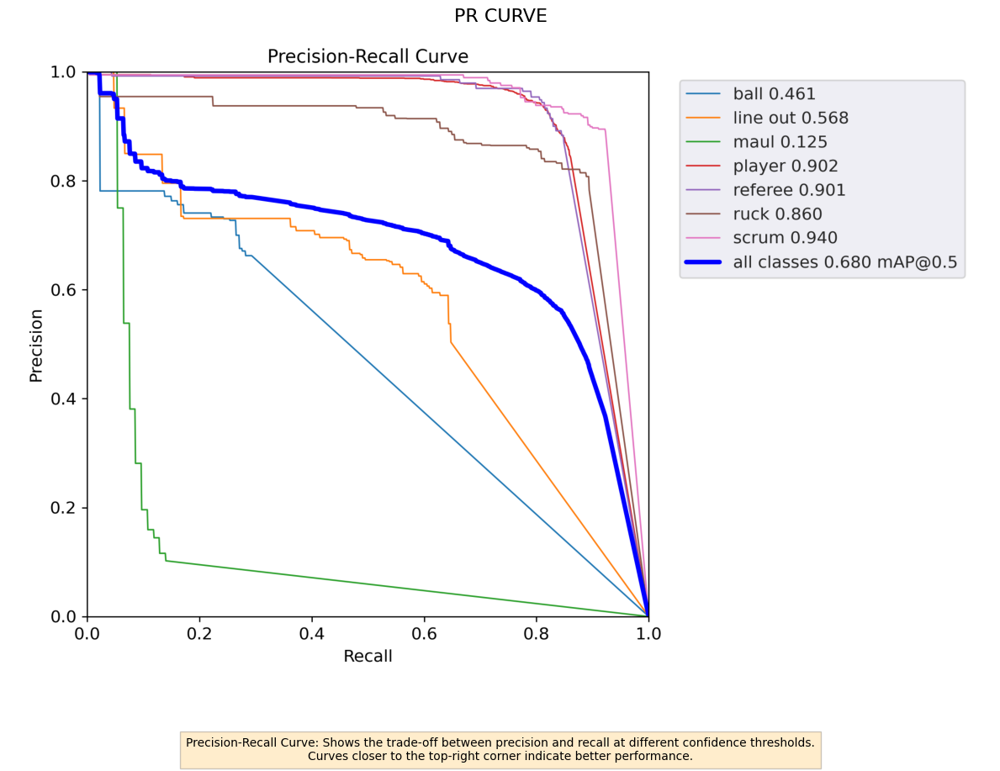

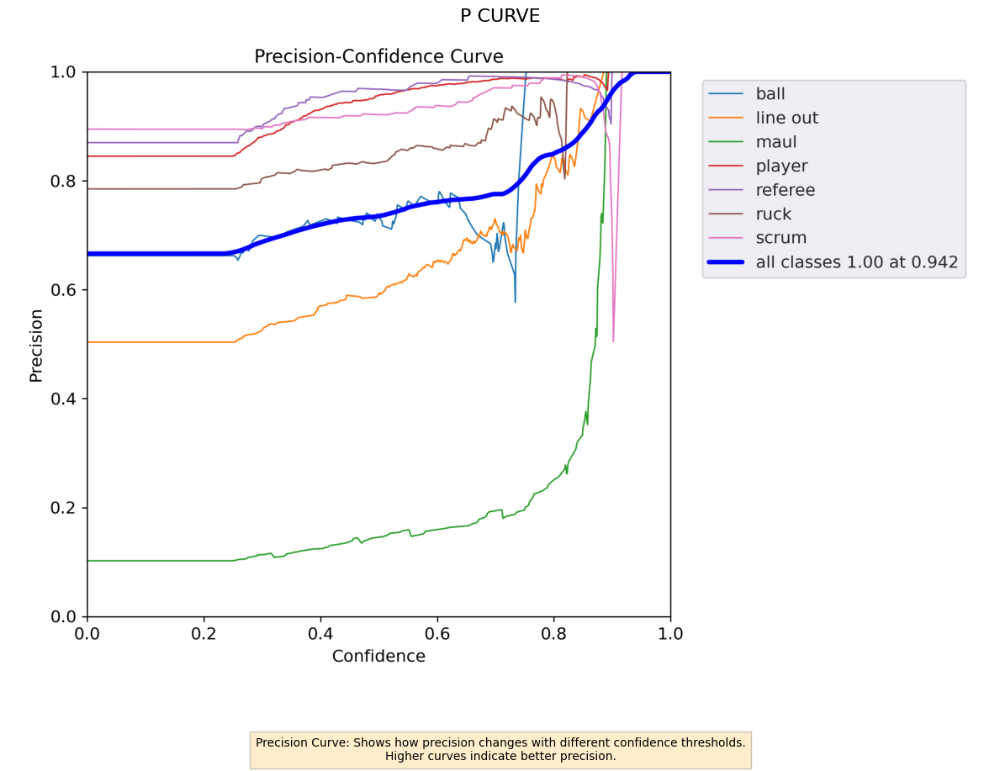

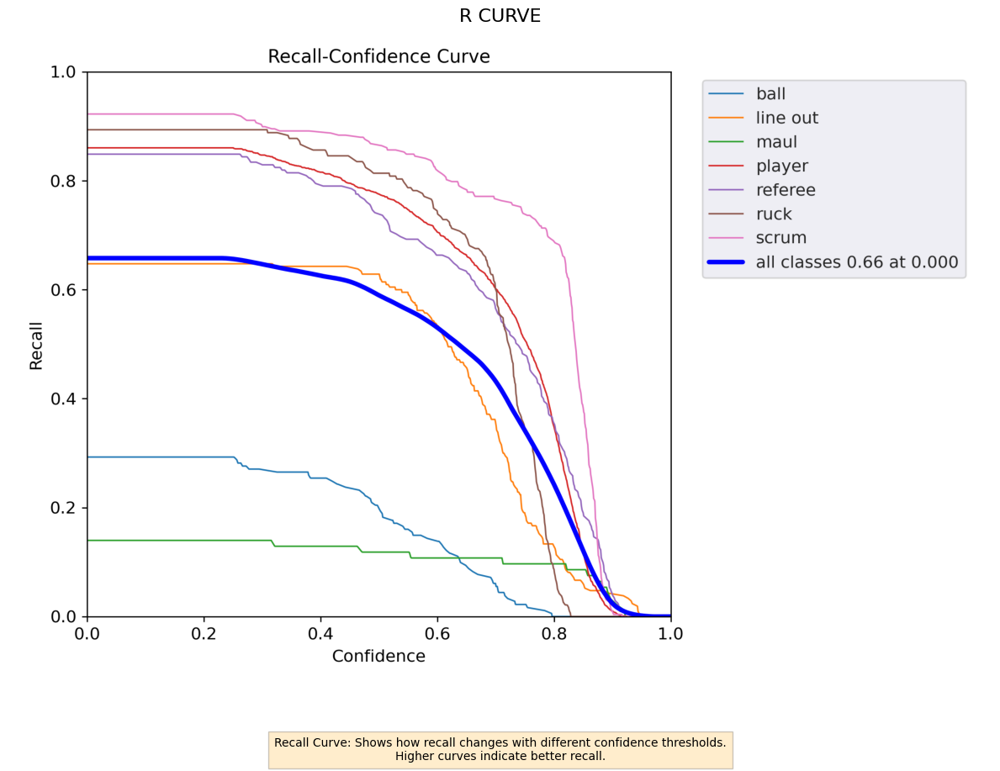

Results.txt not found

CLASS-SPECIFIC PERFORMANCE SUMMARY


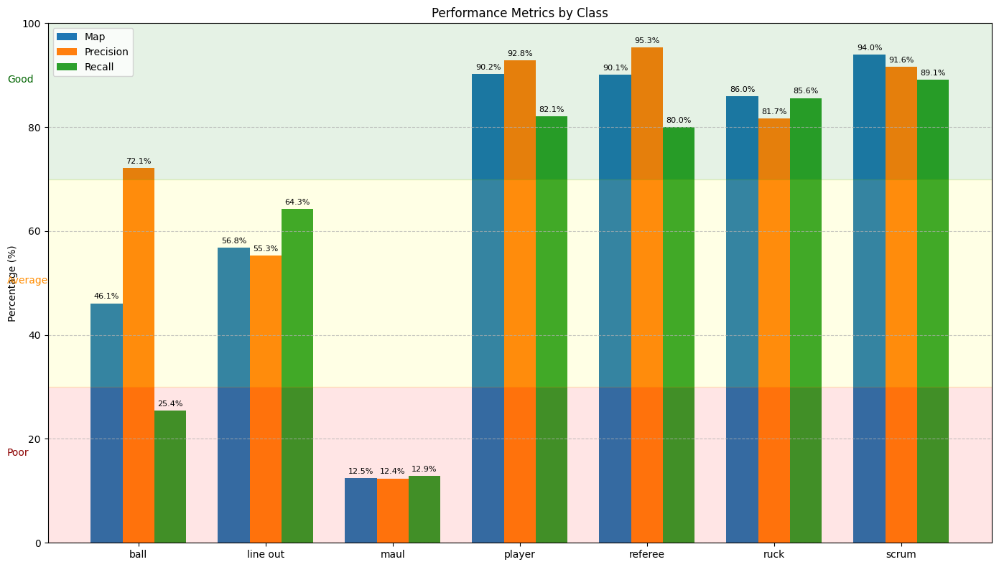


Key Findings:
- Strong performing classes: scrum, player, referee, ruck
- Weak performing classes: maul, ball
- The model performs best on large, distinct objects (players, scrums)
- Smaller or less distinct elements (ball, maul) need improvement

Possible next steps:
1. Collect more training data for maul and ball classes
2. Train with a larger model (YOLOv5m, YOLOv5l)
3. Add more data augmentation to increase variety
4. Fine-tune model parameters specifically for small object detection


In [11]:
# Plot Rugby Detection Model Results
# This script displays evaluation metrics and detection examples

import os
import glob
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from IPython.display import display, HTML

# Set figure size for better visibility
plt.rcParams["figure.figsize"] = (12, 10)

# ========== DISPLAY EVALUATION METRICS ==========
eval_dir = "/content/yolov5/runs/val/rugby_eval/"
print("=" * 50)
print("RUGBY DETECTION MODEL EVALUATION")
print("=" * 50)

# Check if evaluation directory exists
if not os.path.exists(eval_dir):
    print(f"Evaluation directory not found: {eval_dir}")
else:
    # List of plot files to check
    plot_files = [
        "confusion_matrix.png",
        "F1_curve.png",
        "PR_curve.png",
        "P_curve.png",
        "R_curve.png"
    ]

    # Display each plot with explanation
    for plot_file in plot_files:
        plot_path = os.path.join(eval_dir, plot_file)
        if os.path.exists(plot_path):
            plt.figure()
            img = mpimg.imread(plot_path)
            plt.imshow(img)
            plt.axis('off')
            plt.title(plot_file.replace(".png", "").replace("_", " ").upper(), fontsize=16)

            # Add explanation based on plot type
            if "confusion" in plot_file:
                plt.figtext(0.5, 0.01,
                           "Confusion Matrix: Shows how often each class is correctly identified vs. confused with other classes.\n" +
                           "The diagonal represents correct predictions, while off-diagonal elements show misclassifications.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
            elif "F1" in plot_file:
                plt.figtext(0.5, 0.01,
                           "F1 Curve: Shows the F1 score (harmonic mean of precision and recall) at different confidence thresholds.\n" +
                           "Higher curves indicate better performance.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
            elif "PR" in plot_file:
                plt.figtext(0.5, 0.01,
                           "Precision-Recall Curve: Shows the trade-off between precision and recall at different confidence thresholds.\n" +
                           "Curves closer to the top-right corner indicate better performance.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
            elif "P_curve" in plot_file:
                plt.figtext(0.5, 0.01,
                           "Precision Curve: Shows how precision changes with different confidence thresholds.\n" +
                           "Higher curves indicate better precision.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
            elif "R_curve" in plot_file:
                plt.figtext(0.5, 0.01,
                           "Recall Curve: Shows how recall changes with different confidence thresholds.\n" +
                           "Higher curves indicate better recall.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})

            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show()
        else:
            print(f"Plot not found: {plot_file}")

    # Display overall metrics results
    results_file = os.path.join(eval_dir, "results.txt")
    if os.path.exists(results_file):
        with open(results_file, 'r') as f:
            results_text = f.read()

        print("\nOverall Metrics:")
        print("-" * 30)
        print(results_text)
        print("-" * 30)
    else:
        print("Results.txt not found")

# ========== DISPLAY DETECTION EXAMPLES ==========
# Plot Rugby Detection Model Results
# This script displays evaluation metrics and detection examples

import os
import glob
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from IPython.display import display, HTML

# Set figure size for better visibility
plt.rcParams["figure.figsize"] = (12, 10)

# ========== DISPLAY EVALUATION METRICS ==========
eval_dir = "/content/yolov5/runs/val/rugby_eval/"
print("=" * 50)
print("RUGBY DETECTION MODEL EVALUATION")
print("=" * 50)

# Check if evaluation directory exists
if not os.path.exists(eval_dir):
    print(f"Evaluation directory not found: {eval_dir}")
else:
    # List of plot files to check
    plot_files = [
        "confusion_matrix.png",
        "F1_curve.png",
        "PR_curve.png",
        "P_curve.png",
        "R_curve.png"
    ]

    # Display each plot with explanation
    for plot_file in plot_files:
        plot_path = os.path.join(eval_dir, plot_file)
        if os.path.exists(plot_path):
            plt.figure()
            img = mpimg.imread(plot_path)
            plt.imshow(img)
            plt.axis('off')
            plt.title(plot_file.replace(".png", "").replace("_", " ").upper(), fontsize=16)

            # Add explanation based on plot type
            if "confusion" in plot_file:
                plt.figtext(0.5, 0.01,
                           "Confusion Matrix: Shows how often each class is correctly identified vs. confused with other classes.\n" +
                           "The diagonal represents correct predictions, while off-diagonal elements show misclassifications.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
            elif "F1" in plot_file:
                plt.figtext(0.5, 0.01,
                           "F1 Curve: Shows the F1 score (harmonic mean of precision and recall) at different confidence thresholds.\n" +
                           "Higher curves indicate better performance.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
            elif "PR" in plot_file:
                plt.figtext(0.5, 0.01,
                           "Precision-Recall Curve: Shows the trade-off between precision and recall at different confidence thresholds.\n" +
                           "Curves closer to the top-right corner indicate better performance.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
            elif "P_curve" in plot_file:
                plt.figtext(0.5, 0.01,
                           "Precision Curve: Shows how precision changes with different confidence thresholds.\n" +
                           "Higher curves indicate better precision.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
            elif "R_curve" in plot_file:
                plt.figtext(0.5, 0.01,
                           "Recall Curve: Shows how recall changes with different confidence thresholds.\n" +
                           "Higher curves indicate better recall.",
                           ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})

            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show()
        else:
            print(f"Plot not found: {plot_file}")

    # Display overall metrics results
    results_file = os.path.join(eval_dir, "results.txt")
    if os.path.exists(results_file):
        with open(results_file, 'r') as f:
            results_text = f.read()

        print("\nOverall Metrics:")
        print("-" * 30)
        print(results_text)
        print("-" * 30)
    else:
        print("Results.txt not found")

# ========== CLASS-SPECIFIC PERFORMANCE ==========
print("\n" + "=" * 50)
print("CLASS-SPECIFIC PERFORMANCE SUMMARY")
print("=" * 50)

# Display a summary of class performance
class_names = ['ball', 'line out', 'maul', 'player', 'referee', 'ruck', 'scrum']
class_performance = {
    'ball': {'mAP': 46.1, 'precision': 72.1, 'recall': 25.4},
    'line out': {'mAP': 56.8, 'precision': 55.3, 'recall': 64.3},
    'maul': {'mAP': 12.5, 'precision': 12.4, 'recall': 12.9},
    'player': {'mAP': 90.2, 'precision': 92.8, 'recall': 82.1},
    'referee': {'mAP': 90.1, 'precision': 95.3, 'recall': 80.0},
    'ruck': {'mAP': 86.0, 'precision': 81.7, 'recall': 85.6},
    'scrum': {'mAP': 94.0, 'precision': 91.6, 'recall': 89.1}
}

# Plot class performance as a bar chart
metrics = ['mAP', 'precision', 'recall']
class_data = {metric: [class_performance[cls][metric] for cls in class_names] for metric in metrics}

fig, ax = plt.subplots(figsize=(14, 8))
x = np.arange(len(class_names))
width = 0.25

for i, metric in enumerate(metrics):
    offset = width * (i - 1)
    bars = ax.bar(x + offset, class_data[metric], width, label=metric.capitalize())

    # Add value labels on the bars
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.1f}%',
                   xy=(bar.get_x() + bar.get_width() / 2, height),
                   xytext=(0, 3),  # 3 points vertical offset
                   textcoords="offset points",
                   ha='center', va='bottom', rotation=0, fontsize=8)

ax.set_xticks(x)
ax.set_xticklabels(class_names)
ax.set_ylabel('Percentage (%)')
ax.set_title('Performance Metrics by Class')
ax.legend()
ax.set_ylim(0, 100)  # Set y-axis range from 0 to 100%

# Add horizontal grid lines for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Add color-coded background to highlight performance levels
ax.axhspan(0, 30, alpha=0.1, color='red')
ax.axhspan(30, 70, alpha=0.1, color='yellow')
ax.axhspan(70, 100, alpha=0.1, color='green')

# Add annotations for performance levels
plt.figtext(0.01, 0.20, "Poor", fontsize=10, color='darkred')
plt.figtext(0.01, 0.50, "Average", fontsize=10, color='darkorange')
plt.figtext(0.01, 0.85, "Good", fontsize=10, color='darkgreen')

plt.tight_layout()
plt.show()

# Summary points
print("\nKey Findings:")
print("- Strong performing classes: scrum, player, referee, ruck")
print("- Weak performing classes: maul, ball")
print("- The model performs best on large, distinct objects (players, scrums)")
print("- Smaller or less distinct elements (ball, maul) need improvement")
print("\nPossible next steps:")
print("1. Collect more training data for maul and ball classes")
print("2. Train with a larger model (YOLOv5m, YOLOv5l)")
print("3. Add more data augmentation to increase variety")
print("4. Fine-tune model parameters specifically for small object detection")


RUGBY DETECTION EXAMPLES
Found 91 detection result images


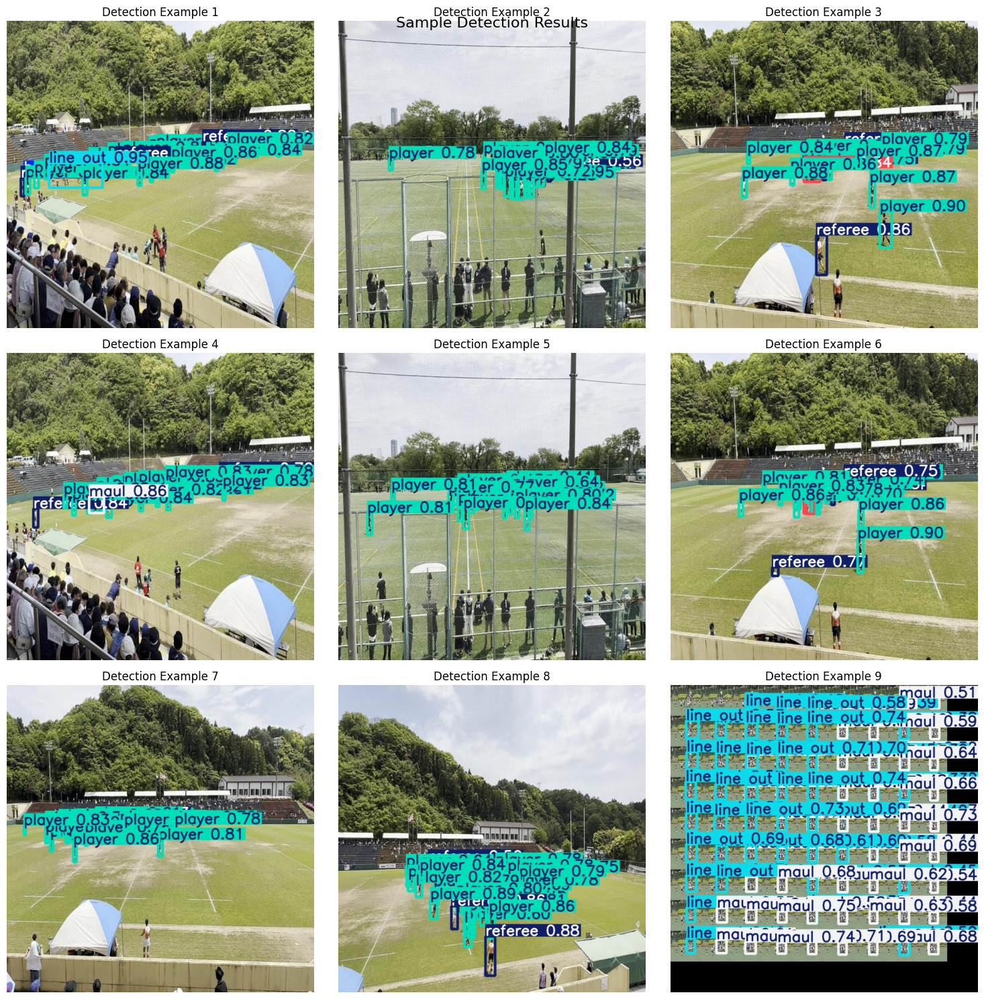

These images show the model's ability to detect and classify rugby elements
Each bounding box indicates a detected object with its class and confidence score


In [12]:
# ========== DISPLAY DETECTION EXAMPLES ==========
detection_dir = "/content/yolov5/runs/detect/rugby_test_detection/"
print("\n" + "=" * 50)
print("RUGBY DETECTION EXAMPLES")
print("=" * 50)

# Check if detection directory exists
if not os.path.exists(detection_dir):
    print(f"Detection results directory not found: {detection_dir}")
else:
    # Get all image files
    image_files = glob.glob(f"{detection_dir}*.jpg") + glob.glob(f"{detection_dir}*.png")

    if not image_files:
        print("No detection result images found")
    else:
        print(f"Found {len(image_files)} detection result images")

        # Select random images for display
        num_display = min(9, len(image_files))
        random.seed(42)  # For reproducibility
        random_images = random.sample(image_files, num_display)

        # Create a grid of detection results
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        axes = axes.flatten()

        for i, img_path in enumerate(random_images):
            if i < len(axes):
                img = mpimg.imread(img_path)
                axes[i].imshow(img)
                axes[i].set_title(f"Detection Example {i+1}", fontsize=12)
                axes[i].axis('off')

        # Hide unused subplots
        for i in range(num_display, len(axes)):
            axes[i].axis('off')

        plt.tight_layout()
        plt.suptitle("Sample Detection Results", fontsize=16, y=0.98)
        plt.show()

        print("These images show the model's ability to detect and classify rugby elements")
        print("Each bounding box indicates a detected object with its class and confidence score")